In [26]:
from keras.models import load_model
import keras
import numpy as np
import cv2
from models import attention_module
import matplotlib.pyplot as plt

In [13]:
face_cascade = cv2.CascadeClassifier('./haarcascade_frontalface_default.xml')     

In [143]:
model1 = load_model('./models/exp5_Resnet50/FER_RAVEDESS_se_block.h5')
weights = model1.get_weights()

In [144]:
model1.layers[2].name

'conv1_conv'

In [145]:
#for resnet models (resnet50)
conv_layers = []
layer_index = []
index = -1
for block in model1.layers:
    index+=1
    if 'conv' not in block.name:
        continue
    if 'conv' not in block.name.split('_')[-1]:
        continue
    filters, biases = block.get_weights()
    print(block.name)
    print(index)
    layer_index.append(index)
print(layer_index)

conv1_conv
2
conv2_block1_1_conv
7
conv2_block1_2_conv
10
conv2_block1_0_conv
13
conv2_block1_3_conv
14
conv2_block2_1_conv
19
conv2_block2_2_conv
22
conv2_block2_3_conv
25
conv2_block3_1_conv
29
conv2_block3_2_conv
32
conv2_block3_3_conv
35
conv3_block1_1_conv
39
conv3_block1_2_conv
42
conv3_block1_0_conv
45
conv3_block1_3_conv
46
conv3_block2_1_conv
51
conv3_block2_2_conv
54
conv3_block2_3_conv
57
conv3_block3_1_conv
61
conv3_block3_2_conv
64
conv3_block3_3_conv
67
conv3_block4_1_conv
71
conv3_block4_2_conv
74
conv3_block4_3_conv
77
conv4_block1_1_conv
81
conv4_block1_2_conv
84
conv4_block1_0_conv
87
conv4_block1_3_conv
88
conv4_block2_1_conv
93
conv4_block2_2_conv
96
conv4_block2_3_conv
99
conv4_block3_1_conv
103
conv4_block3_2_conv
106
conv4_block3_3_conv
109
conv4_block4_1_conv
113
conv4_block4_2_conv
116
conv4_block4_3_conv
119
conv4_block5_1_conv
123
conv4_block5_2_conv
126
conv4_block5_3_conv
129
conv4_block6_1_conv
133
conv4_block6_2_conv
136
conv4_block6_3_conv
139
conv5_bloc

In [146]:
#for vgg network
# conv_layers = []
# for block in model1.layers:
#     if 'block' not in block.name:
#         continue
#     if 'conv' not in block.name:
#         continue
#     filters, biases = block.get_weights()
#     conv_layers.append(block.name)
#     print(f'Layer Name: {block.name} filter shape: {filters.shape}')
# conv_layers

In [147]:
# for custom model
# convlist = []
# for i in model1.layers:
#     if 'block1_conv' not in i.name:
#         continue
#     filters, biases = i.get_weights()
#     convlist.append(i.name)
#     print(f'Layer Name: {i.name} filter shape: {filters.shape}')
# convlist

In [148]:
#getting the weights for first hidden layer
print('weights for:\n',model1.layers[2].name)
filters, biases = model1.layers[2].get_weights()
#normalizing the weights
f_min, f_max = filters.min(), filters.max()
filters = (filters-f_min)/(f_max-f_min)
filters.max(), filters.min()

weights for:
 conv1_conv


(1.0, 0.0)

In [149]:
model = keras.Model(inputs=model1.inputs, outputs=model1.layers[2].output)

(1, 148, 148, 3)

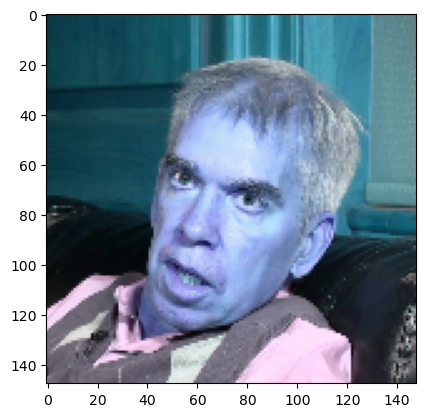

In [150]:
image = cv2.resize(cv2.imread('./ravedess_new/angry/Original/133 Original.jpg'), (148,148))
plt.imshow(image, cmap='gray')
# face = face_cascade.detectMultiScale(image, 1.05,3)
# print(face)
# img_face = image[face[0,1]:face[0,1]+face[0,3], face[0,0]:face[0,0]+face[0,2]]
# image_face = cv2.resize(img_face,(148,148))
# face_in_image = extract_face(image)
# image = keras.utils.img_to_array(face_in_image)
image = np.expand_dims(image, axis=0)
image.shape

In [152]:
# plt.imshow(img_face, cmap='gray')
# image.shape

In [153]:
features = model.predict(image)

1/1 [==============================] - 0s 314ms/step


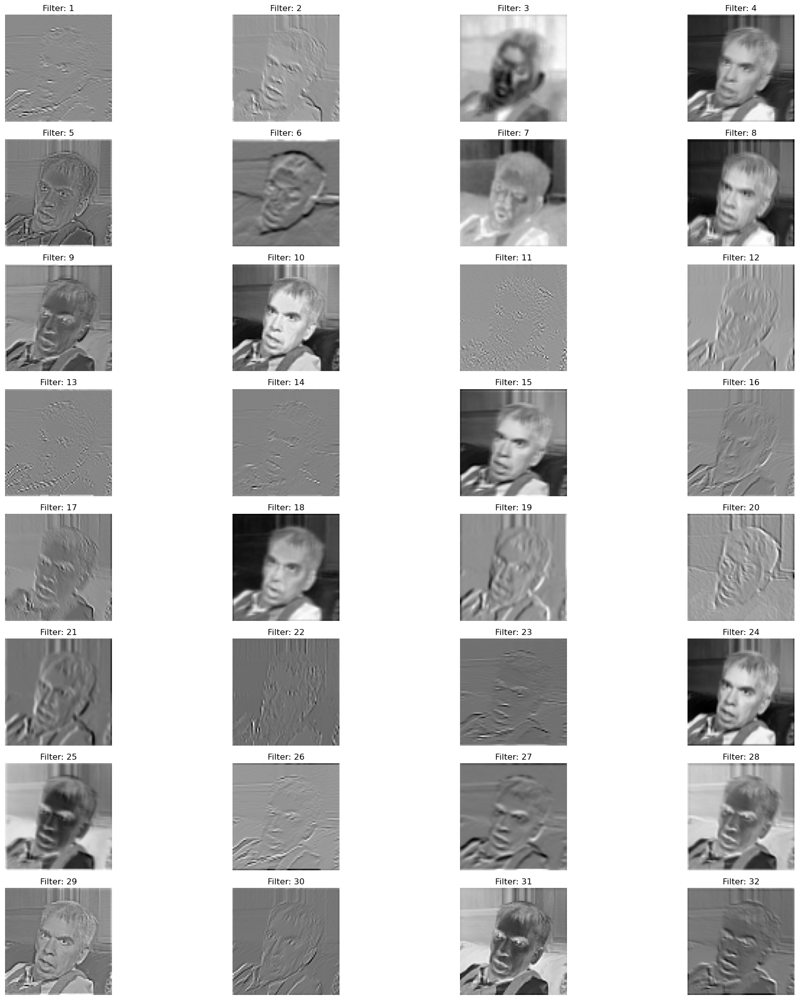

In [154]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(8,4, figsize=(20,20))
for index, axis in enumerate(ax.flat):
    axis.set_title('Filter: '+str(index+1))
    axis.imshow(features[:,:,:,index-1].squeeze(0), cmap='gray')
    axis.axis('off')
plt.tight_layout()

In [155]:
# layer_index = [1,2,4,5,7,8,9,10,12,13,14,15,17,18,19,20]
layer_index
outputs = [model1.layers[i].output for i in layer_index]
my_model = keras.Model(inputs=model1.inputs, outputs=outputs)
print(layer_index)

[2, 7, 10, 13, 14, 19, 22, 25, 29, 32, 35, 39, 42, 45, 46, 51, 54, 57, 61, 64, 67, 71, 74, 77, 81, 84, 87, 88, 93, 96, 99, 103, 106, 109, 113, 116, 119, 123, 126, 129, 133, 136, 139, 143, 146, 149, 150, 155, 158, 161, 165, 168, 171]


1/1 [==============================] - 0s 201ms/step


C:\Users\kaleem ullah\AppData\Local\Temp\ipykernel_11020\471960687.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(8,8, figsize=(10,10))


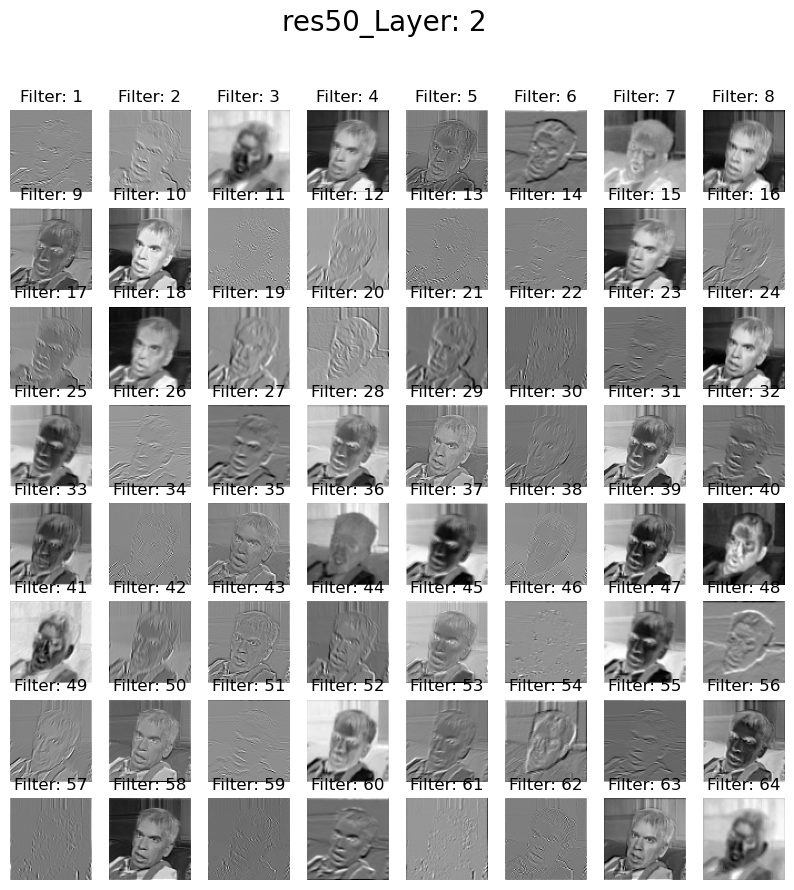

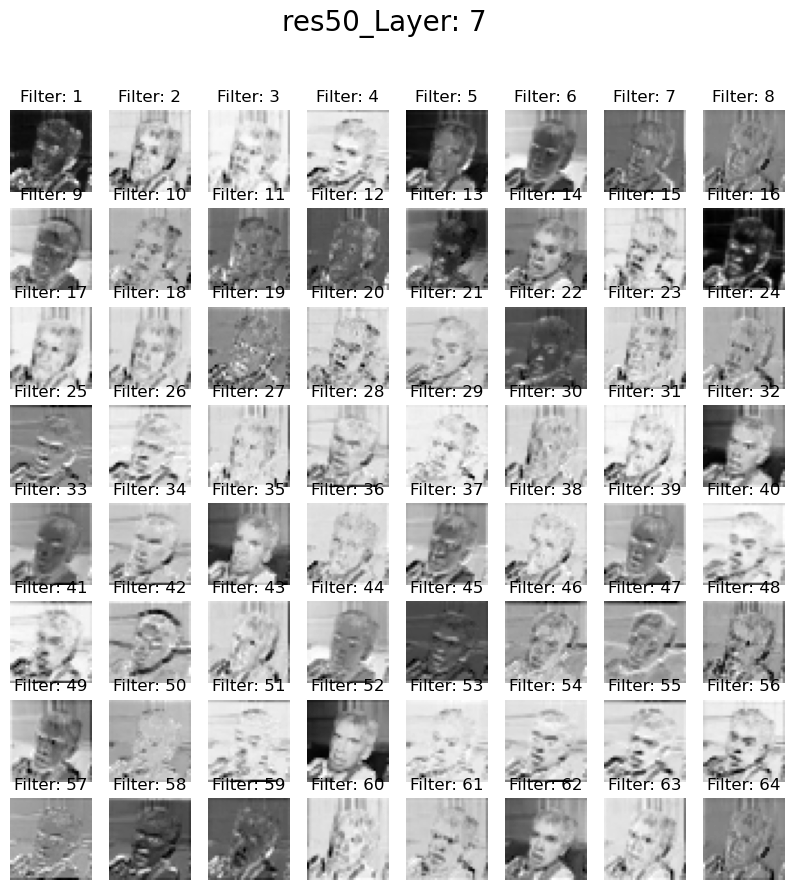

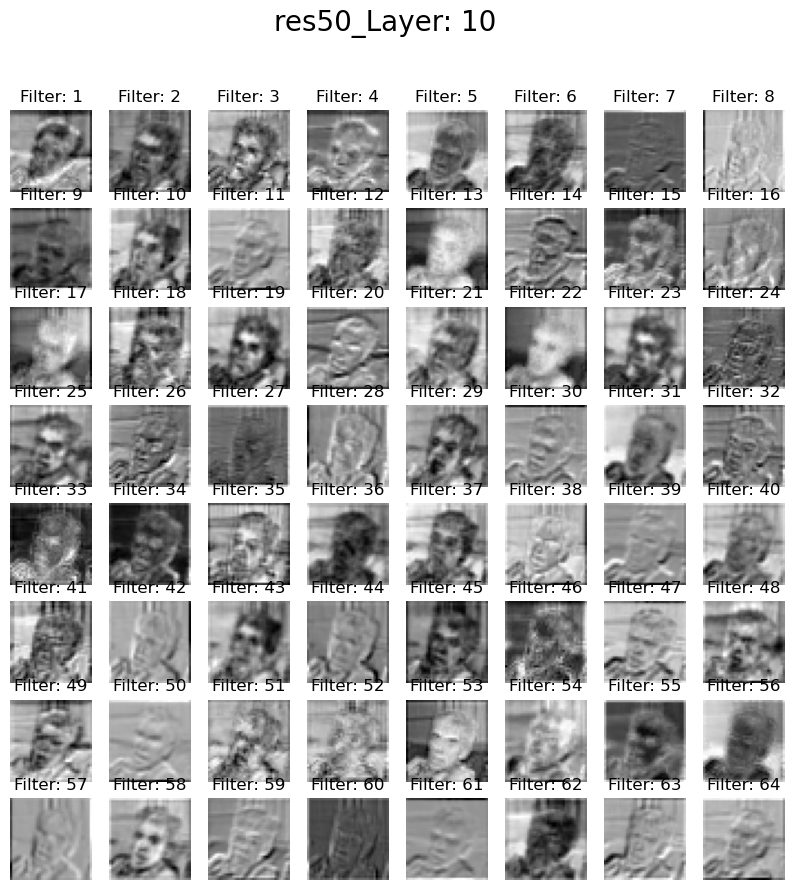

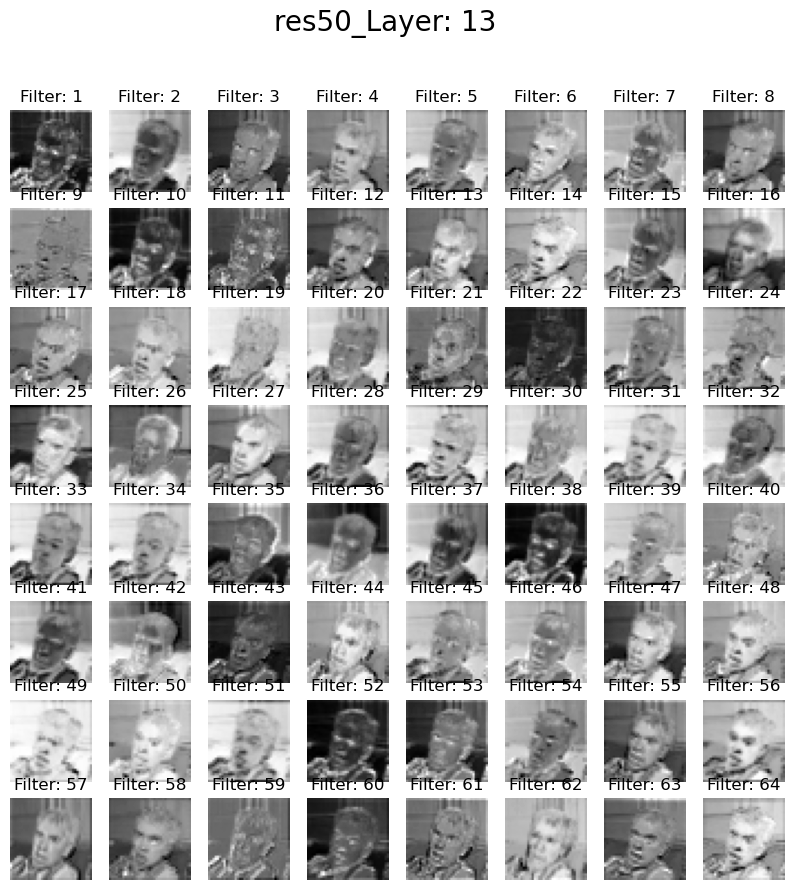

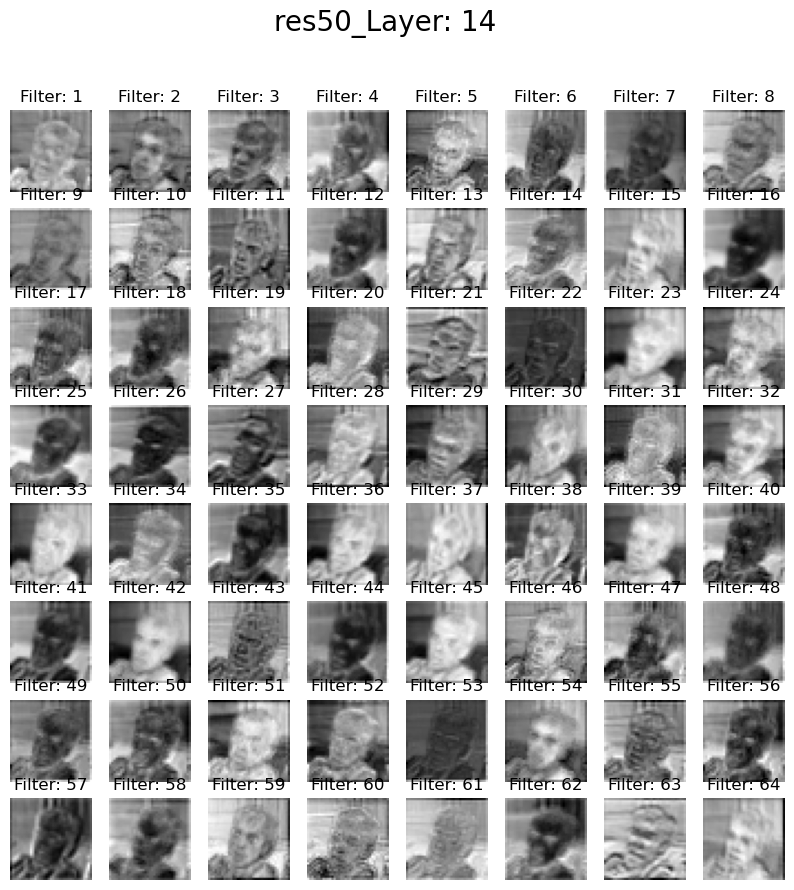

...

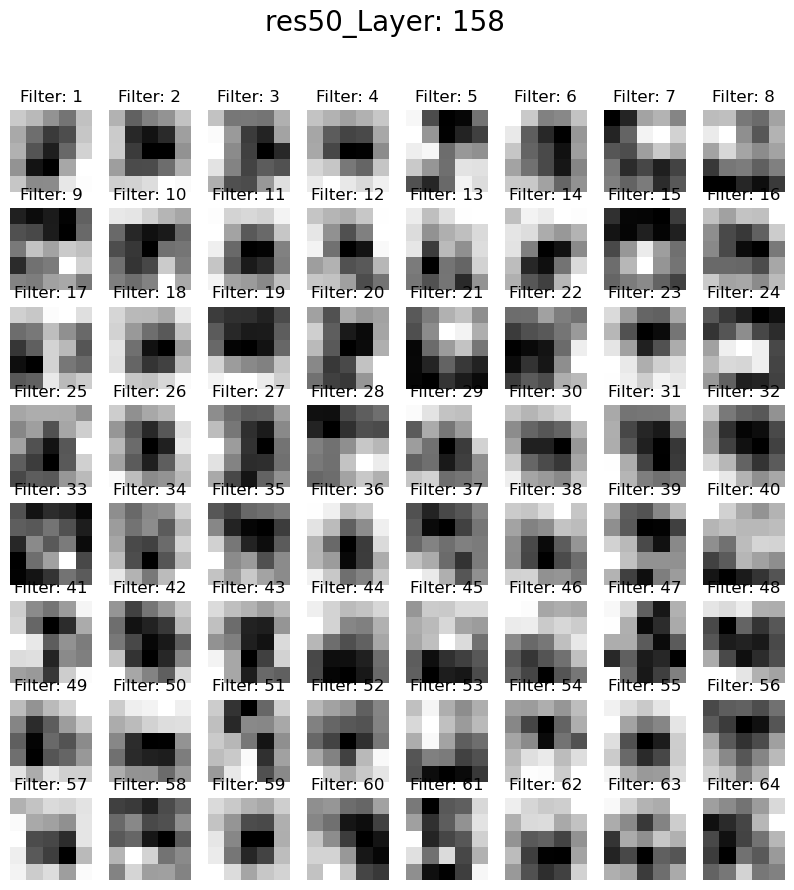

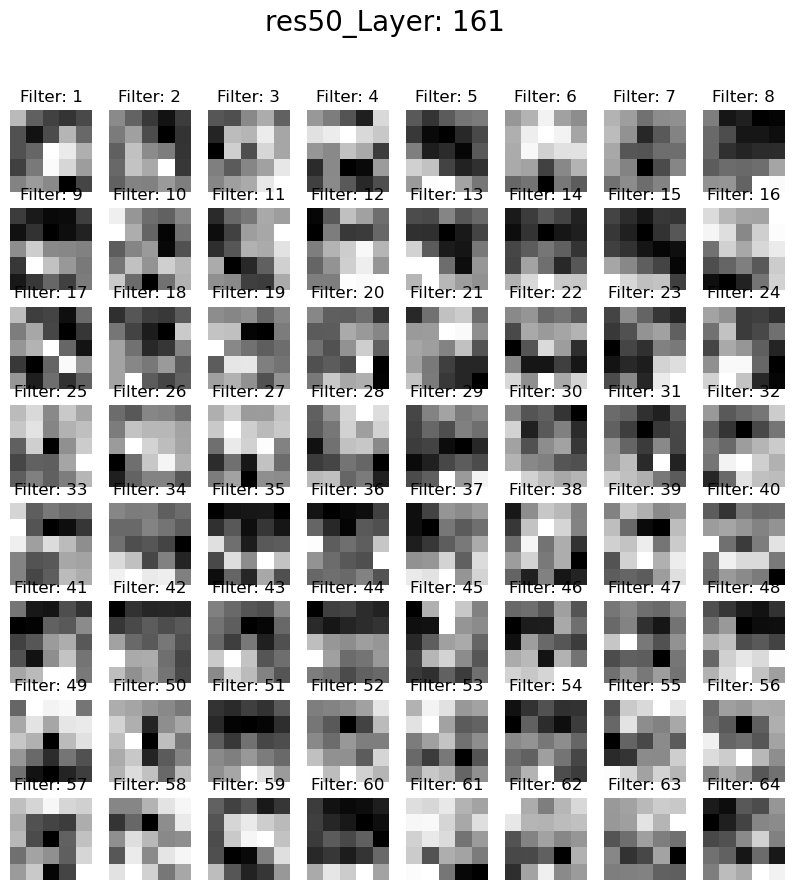

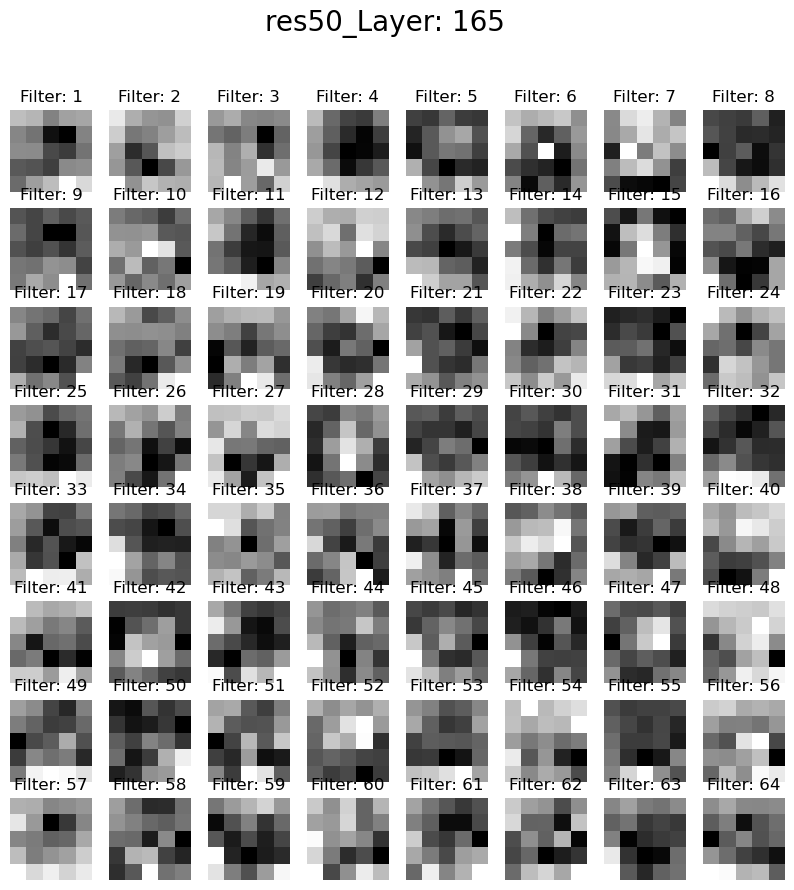

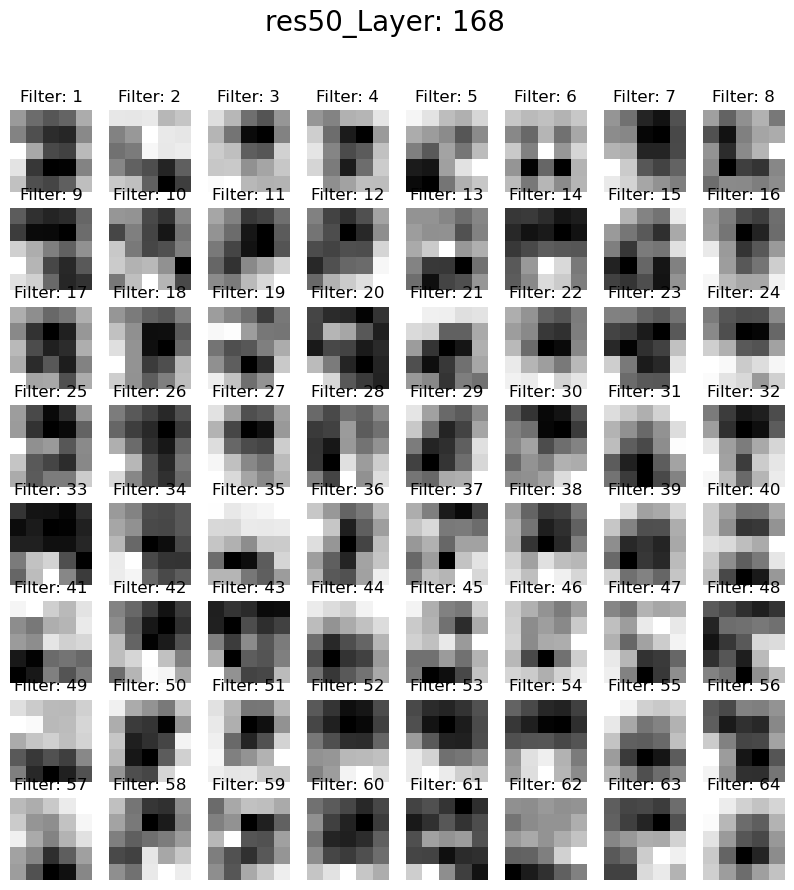

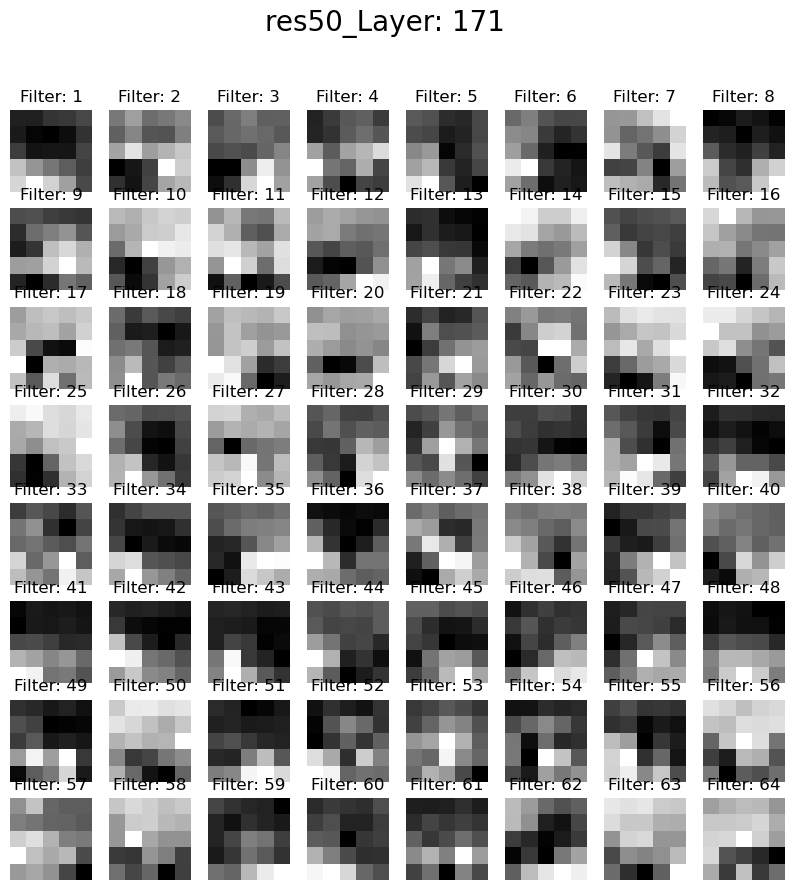

In [157]:
feature_map = my_model.predict(image)
saving_path = 'featureMaps/resnet50/ravdess/'
for index, feat in zip(layer_index,feature_map):
    fig, ax = plt.subplots(8,8, figsize=(10,10))
    for i, axis in enumerate(ax.flat):
        axis.axis('off')
        axis.set_title('Filter: '+ str(i+1))
        axis.imshow(feat[:,:,:,i-1].squeeze(0), cmap='gray')
#     fig = plt.figure(figsize=(10,10))
        fig.suptitle('res50_Layer: {}'.format(index), fontsize=20)
#     for i in range(1,feat.shape[-1]+1):
#         plt.subplot(8,8,index)
        plt.imshow(feat[:,:,:,index-1].squeeze(0), cmap='gray')
        plt.savefig(saving_path+'ravdess_SE_res50_Layer_'+str(index)+'.png')
#     plt.tight_layout

In [133]:
model1.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 148, 148, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 154, 154, 3)  0           ['input_13[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 74, 74, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 74, 74, 64)   256         ['conv1_conv[0][0]']      

 conv2_block3_2_conv (Conv2D)   (None, 37, 37, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 37, 37, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 37, 37, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_3_conv (Conv2D)   (None, 37, 37, 256)  16640       ['conv2_block3_2_relu[0][0]']    
                                                                                                  
 conv2_blo

 conv3_block3_2_conv (Conv2D)   (None, 19, 19, 128)  147584      ['conv3_block3_1_relu[0][0]']    
                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 19, 19, 128)  512        ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 19, 19, 128)  0          ['conv3_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_3_conv (Conv2D)   (None, 19, 19, 512)  66048       ['conv3_block3_2_relu[0][0]']    
                                                                                                  
 conv3_blo

 conv4_block2_1_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 10, 10, 256)  590080      ['conv4_block2_1_relu[0][0]']    
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 10, 10, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_2_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block2_2_bn[0][0]']      
 n)                                                                                               
          

                                                                                                  
 conv4_block5_1_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block5_2_conv (Conv2D)   (None, 10, 10, 256)  590080      ['conv4_block5_1_relu[0][0]']    
                                                                                                  
 conv4_block5_2_bn (BatchNormal  (None, 10, 10, 256)  1024       ['conv4_block5_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_2_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block5_2_bn[0][0]']      
 n)       

 conv5_block2_1_conv (Conv2D)   (None, 5, 5, 512)    1049088     ['conv5_block1_out[0][0]']       
                                                                                                  
 conv5_block2_1_bn (BatchNormal  (None, 5, 5, 512)   2048        ['conv5_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_1_relu (Activatio  (None, 5, 5, 512)   0           ['conv5_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block2_2_conv (Conv2D)   (None, 5, 5, 512)    2359808     ['conv5_block2_1_relu[0][0]']    
                                                                                                  
 conv5_blo